In [1]:
import os
import sys
import numpy as np
import scipy as sp
import xarray as xr
import netCDF4
import math
from netCDF4 import Dataset
import pandas as pd
from datetime import datetime, date, time, timedelta      
import time
from copy import deepcopy
from scipy import ndimage, stats
import pytz

utc = pytz.utc  


import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.img_tiles import GoogleTiles
import scipy.ndimage as ndimage
from cartopy.feature import ShapelyFeature
from cartopy.io.shapereader import Reader
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm

# plotting stuff, 
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

class ShadedReliefESRI(GoogleTiles):
#    # shaded relief
   def _image_url(self, tile):
        x, y, z = tile
        url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
               'NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}.jpg').format(
              z=z, y=y, x=x)

        return url


import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
from scipy.stats import spearmanr
from scipy.stats import pearsonr


C:\Users\python\Anaconda3\lib\site-packages\xarray\core\merge.py:10: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  PANDAS_TYPES = (pd.Series, pd.DataFrame, pd.Panel)


##   matlab  2 datetime

In [2]:
import datetime as dt
def matlab2datetime(matlab_datenum):
    day = dt.datetime.fromordinal(int(matlab_datenum))
    dayfrac = dt.timedelta(days=matlab_datenum%1) - dt.timedelta(days = 366)
#    return day + dayfrac


## Compare individual DPR and HN 15 minute scans

In [3]:
# read in the path for comparison
path = '/JUL/201307121800.nc'
dp = 'DP'
hn = 'HN'
path

'/JUL/201307121800.nc'

In [88]:
# read in reformatted netcdf HN (15 minute accumulation)
from netCDF4 import Dataset
path2 = Dataset(hn + path)
time = pd.Timestamp(year=int(path[5:9]), month=int(path[9:11]), day=int(path[11:13]),
                        hour=int(path[13:15]), minute=int(path[15:17]))
rain2 = path2.variables['rain'][:]
lat =  path2.variables['lat'][:]
lon = path2.variables['lon'][:]

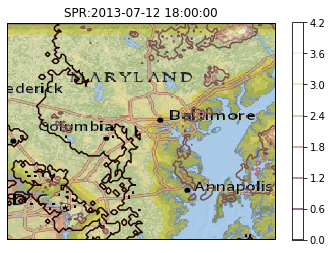

In [89]:

ax = plt.axes(projection=ccrs.PlateCarree()) #,xlim=[-76.3, -76.1], ylim=[38.7, 38.9])
#ax.set_xticks(np.arange(-76.3,-76.1,0.1))
#ax.set_yticks(np.arange(38.7,38.9,0.1))
plt.contour(lon,lat,rain2, cmap = 'pink')
ax.add_image(ShadedReliefESRI(), 8)
plt.title("SPR:" + str(time))
plt.colorbar()

In [90]:
# read in reformatted netcdf DPR (mm/h)
from netCDF4 import Dataset
m3 = Dataset(dp + path)
raind = m3.variables['dpr'][:]
latd =  m3.variables['lat'][:]
lond = m3.variables['lon'][:]

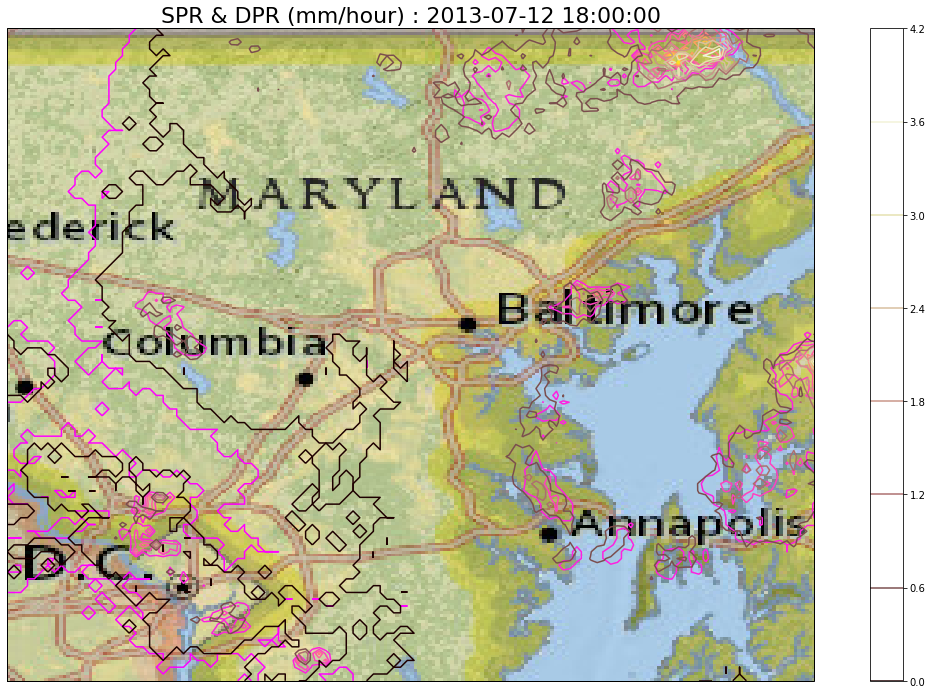

In [91]:
fig, ax = plt.subplots(figsize=(20, 12))
plt.title("HN:" + str(time))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_image(ShadedReliefESRI(), 8)
plt.contour(lond,latd,raind, cmap = 'spring')
plt.contour(lon,lat,rain2, cmap = 'pink')
plt.title('SPR & DPR (mm/hour) : ' + str(time), fontsize = 22)
#plt.legend('s', 'd')
plt.colorbar()
plt.savefig('SPRDPRCompare.png')

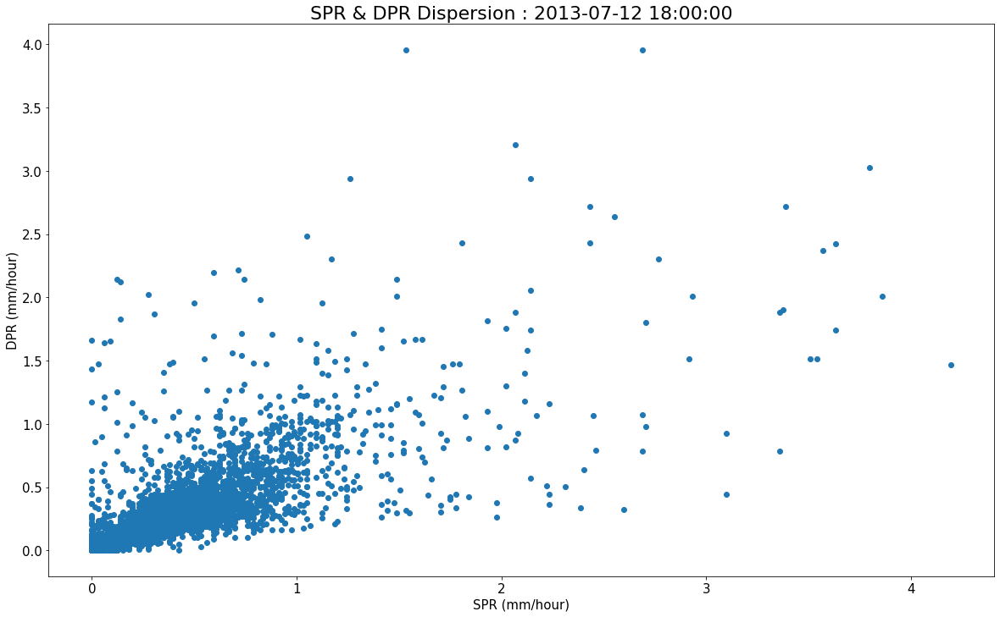

In [92]:
# not sure what this does but it looks cool, shows dispersion
fig, ax = plt.subplots(figsize = (20,12))
plt.scatter(rain2,raind)
plt.title('SPR & DPR Dispersion : ' + str(time), fontsize = 22)
plt.xlabel('SPR (mm/hour)', fontsize = 15)
plt.ylabel('DPR (mm/hour)', fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
#plt.description('For each latitude and longitude, the differing values of rain rate that DPR and HN have recorded')
plt.savefig('SPRDPRDispersion.png')

## Create file paths and summaries for different time periods 

### DPR

In [ ]:
# DONT HAVE DPR YET!
import os
import fnmatch
import glob
grid_pathd = []
grid_path2012 = []
grid_path2013 = []
grid_path2014 = []
grid_path2015 = []
grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2012/'):
    grid_path04 += glob.glob(os.path.join(root, '201204*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201205*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201206*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201207*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201208*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201209*.nc'))
grid_path2012 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201206 = grid_path06
grid_path201207 = grid_path07
grid_path201208 = grid_path08
grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2013/'):
    grid_path04 += glob.glob(os.path.join(root, '201304*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201305*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201306*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201307*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201308*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201309*.nc'))
grid_path2013 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201306 = grid_path06
grid_path201307 = grid_path07
grid_path201308 = grid_path08
grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2014/'):
    grid_path04 += glob.glob(os.path.join(root, '201404*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201405*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201406*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201407*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201408*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201409*.nc'))
grid_path2014 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201406 = grid_path06
grid_path201407 = grid_path07
grid_path201408 = grid_path08
grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2015/'):
    grid_path04 += glob.glob(os.path.join(root, '201504*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201505*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201506*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201507*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201508*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201509*.nc'))
grid_path2015 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201506 = grid_path06
grid_path201507 = grid_path07
grid_path201508 = grid_path08


#grid_pathd = grid_path2012 + grid_path2013 + grid_path2014 + grid_path2015;
#grid_pathd = grid_path201206 + grid_path201306 + grid_path201406 + grid_path201506;
grid_pathd = grid_path201207 + grid_path201307 + grid_path201407 + grid_path201507;
#grid_pathd = grid_path201208 + grid_path201308 + grid_path201408 + grid_path201508;
grid_pathd.sort()
grid_pathd
DPRtot = len(grid_pathd)


In [ ]:
# DONT HAVE DPR YET!
#  Rainfall sum
i=0
for path in grid_pathd:
    mm = Dataset(path)
    if i == 0:    
        latd = mm.variables['lat'][:]
        lond = mm.variables['lon'][:]
        dpr = mm.variables['dpr'][:]
        dpr[dpr<0] = 0.;
    if i > 0: 
        ddd = mm.variables['dpr'][:]    
        ddd[ddd<0] = 0.;
        dpr = dpr + ddd;
    i=i+1

In [ ]:
# DONT HAVE DPR YET!
# sum above a threshold (50/4 is 50 mm/h threshold)
thresh=50./4.;
i=0
for path in grid_path201206:
    mm = Dataset(path)
    if i == 0:    
        latd = mm.variables['lat'][:]
        lond = mm.variables['lon'][:]
        dpr = mm.variables['dpr'][:]
        dpr[dpr<thresh] = 0.;
        dpr[dpr>=thresh] = 1.;
    if i > 0: 
        ddd = mm.variables['dpr'][:]    
        ddd[ddd<thresh] = 0.;
        ddd[ddd>=thresh] = 1.;
        dpr = dpr + ddd;
    i=i+1

In [ ]:
# DONT HAVE DPR YET!
#levels=[10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
#levels=[100,200,300,400,500,600,700,800,900,1000,1100]
levels=[100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850]

plt.contourf(lond,latd,dpr, levels = levels)
plt.colorbar()

### HN

In [4]:
import os
import fnmatch
import glob
year = 2004
grid_pathall = []
grid_path01 = []
grid_path02 = []
grid_path03 = []
grid_path04 = []
grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
grid_path10 = []
grid_path11 = []
grid_path12 = []

grid_path01 += glob.glob(os.path.join(hn + '/JAN/' + str(year) + '*.nc'))
grid_path02 += glob.glob(os.path.join(hn + '/FEB/' + str(year) + '*.nc'))
grid_path03 += glob.glob(os.path.join(hn + '/MAR/' + str(year) + '*.nc'))
grid_path04 += glob.glob(os.path.join(hn + '/APR/' + str(year) + '*.nc'))
grid_path05 += glob.glob(os.path.join(hn + '/MAY/' + str(year) + '*.nc'))
grid_path06 += glob.glob(os.path.join(hn + '/JUN/' + str(year) + '*.nc'))
grid_path07 += glob.glob(os.path.join(hn + '/JUL/' + str(year) + '*.nc'))
grid_path08 += glob.glob(os.path.join(hn + '/AUG/' + str(year) + '*.nc'))
grid_path09 += glob.glob(os.path.join(hn + '/SEP/' + str(year) + '*.nc'))
grid_path10 += glob.glob(os.path.join(hn + '/OCT/' + str(year) + '*.nc'))
grid_path11 += glob.glob(os.path.join(hn + '/NOV/' + str(year) + '*.nc'))
grid_path12 += glob.glob(os.path.join(hn + '/DEC/' + str(year) + '*.nc'))

grid_path01.sort()
grid_path02.sort()
grid_path03.sort()
grid_path04.sort()
grid_path05.sort()
grid_path06.sort()
grid_path07.sort()
grid_path08.sort()
grid_path09.sort()
grid_path10.sort()
grid_path11.sort()
grid_path12.sort()
grid_pathall = (grid_path01 + grid_path02 + grid_path03 + grid_path04 
                + grid_path05 + grid_path06 + grid_path07 + grid_path08
                + grid_path09 + grid_path10 + grid_path11 + grid_path12)
HNtot = len(grid_path01)


In [5]:
# Check that components are correct
print(len(grid_path01))
print(len(grid_path02))
print(len(grid_path03))
print(len(grid_path04))
print(len(grid_path05))
print(len(grid_path06))
print(len(grid_path07))
print(len(grid_path08))
print(len(grid_path09))
print(len(grid_path10))
print(len(grid_path11))
print(len(grid_path12))
grid_path08[1]

0
0
0
2703
2466
2791
2400
2581
2142
0
0
0


'HN/AUG\\200408010015.nc'

In [240]:
import os
import fnmatch
import glob
year = 2012

grid_pathall = []
grid_path01 = []
grid_path02 = []
grid_path03 = []
grid_path04 = []
grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
grid_path10 = []
grid_path11 = []
grid_path12 = []

grid_path01 += glob.glob(os.path.join(dp + '/JAN/' + str(year) + '*.nc'))
grid_path02 += glob.glob(os.path.join(dp + '/FEB/' + str(year) + '*.nc'))
grid_path03 += glob.glob(os.path.join(dp + '/MAR/' + str(year) + '*.nc'))
grid_path04 += glob.glob(os.path.join(dp + '/APR/' + str(year) + '*.nc'))
grid_path05 += glob.glob(os.path.join(dp + '/MAY/' + str(year) + '*.nc'))
grid_path06 += glob.glob(os.path.join(dp + '/JUN/' + str(year) + '*.nc'))
grid_path07 += glob.glob(os.path.join(dp + '/JUL/' + str(year) + '*.nc'))
grid_path08 += glob.glob(os.path.join(dp + '/AUG/' + str(year) + '*.nc'))
grid_path09 += glob.glob(os.path.join(dp + '/SEP/' + str(year) + '*.nc'))
grid_path10 += glob.glob(os.path.join(dp + '/OCT/' + str(year) + '*.nc'))
grid_path11 += glob.glob(os.path.join(dp + '/NOV/' + str(year) + '*.nc'))
grid_path12 += glob.glob(os.path.join(dp + '/DEC/' + str(year) + '*.nc'))

grid_path01.sort()
grid_path02.sort()
grid_path03.sort()
grid_path04.sort()
grid_path05.sort()
grid_path06.sort()
grid_path07.sort()
grid_path08.sort()
grid_path09.sort()
grid_path10.sort()
grid_path11.sort()
grid_path12.sort()
grid_pathall = (grid_path01 + grid_path02 + grid_path03 + grid_path04 
                + grid_path05 + grid_path06 + grid_path07 + grid_path08
                + grid_path09 + grid_path10 + grid_path11 + grid_path12)
HNtot = len(grid_path01)


In [241]:
# Check that components are correct
print(len(grid_path01))
print(len(grid_path02))
print(len(grid_path03))
print(len(grid_path04))
print(len(grid_path05))
print(len(grid_path06))
print(len(grid_path07))
print(len(grid_path08))
print(len(grid_path09))
print(len(grid_path10))
print(len(grid_path11))
print(len(grid_path12))
grid_path08[1]

0
0
0
2784
2976
2880
2976
2976
2880
0
0
0


'DP/AUG\\201208010015.nc'

In [142]:
# takes a long time to run
# creates a data frame that can be reordered by Hour
times = []
obs = []
thresh = 25
for path in grid_pathall:
    ds = xr.open_dataset(path)

    num_obs = int((ds.rain>thresh).sum())
    time = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    times.append(time)
    obs.append(num_obs)
    
    
df = pd.DataFrame(index=times)
df['25'] = obs
df

In [ ]:
df.resample(how='sum', rule='1H')

In [113]:
path

'HN/JAN\\200101031630.nc'

In [140]:
path = grid_path06[5]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

# print(path)
# ds.time

HN/JUN\200106010115.nc


<xarray.DataArray 'time' ()>
array('2001-06-01T01:15:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2001-06-01T01:15:00

In [269]:
path = grid_path06[1]
adds = xr.open_dataset(path)
adds['time'] = pd.Timestamp(year=int(path[4:8]), month=int(path[8:10]), day=int(path[10:12]),
                        hour=int(path[12:14]), minute=int(path[14:16]))
adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
adds = adds.set_coords(['time', 'lat', 'lon'])
adds

ValueError: invalid literal for int() with base 10: 'UN\\2'

In [278]:
path = grid_path04[0]
ds = xr.open_dataset(path)
ds = ds.rename(['dpr','rain'])

NameError: name 'columns' is not defined

# Creates an NC file for future use that can be resampled hourly / 3 hourly

In [7]:
# # uses a dataset that can be reorganized by hour
# path = grid_path01[0]
# ds = xr.open_dataset(path)
# ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
# ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
# ds = ds.set_coords(['time', 'lat', 'lon'])

# for path in grid_path01[1:]:
#     adds = xr.open_dataset(path)
#     adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
#     adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
#     adds = adds.set_coords(['time', 'lat', 'lon'])
#     ds = xr.concat([ds, adds])
    
# # creates the time as a dimension instead of a variable
# ds = ds.rename({'concat_dims':'time'})
# # saves it as an nc file
# ds.to_netcdf(str(year) + '_' + '01.nc')

In [8]:
# # uses a dataset that can be reorganized by hour
# path = grid_path02[0]
# ds = xr.open_dataset(path)
# ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
# ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
# ds = ds.set_coords(['time', 'lat', 'lon'])

# for path in grid_path02[1:]:
#     adds = xr.open_dataset(path)
#     adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
#     adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
#     adds = adds.set_coords(['time', 'lat', 'lon'])
#     ds = xr.concat([ds, adds])
    
# # creates the time as a dimension instead of a variable
# ds = ds.rename({'concat_dims':'time'})
# ds.to_netcdf(str(year) + '_' + '02.nc')

In [265]:
# # uses a dataset that can be reorganized by hour
# path = grid_path03[0]
# ds = xr.open_dataset(path)
# ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
# ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
# ds = ds.set_coords(['time', 'lat', 'lon'])

# for path in grid_path03[1:]:
#     adds = xr.open_dataset(path)
#     adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
#     adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
#     adds = adds.set_coords(['time', 'lat', 'lon'])
#     ds = xr.concat([ds, adds])
    
# # creates the time as a dimension instead of a variable
# # ds = ds.rename({'concat_dims':'time'})
# ds.to_netcdf(str(year) + '_' + '03.nc')

In [6]:
# uses a dataset that can be reorganized by hour
path = grid_path04[0]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

for path in grid_path04[1:]:
    adds = xr.open_dataset(path)
    adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
    adds = adds.set_coords(['time', 'lat', 'lon'])
    try:
        ds = xr.concat([ds, adds])
    except:
        pass
    
# creates the time as a dimension instead of a variable
ds = ds.rename({'concat_dims':'time'})
ds.to_netcdf(str(year) + '_' + '04.nc')

In [7]:
# uses a dataset that can be reorganized by hour
path = grid_path05[0]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

for path in grid_path05[1:]:
    adds = xr.open_dataset(path)
    adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
    adds = adds.set_coords(['time', 'lat', 'lon'])
    ds = xr.concat([ds, adds])
    
# creates the time as a dimension instead of a variable
ds = ds.rename({'concat_dims':'time'})
ds.to_netcdf(str(year) + '_' + '05.nc')

In [8]:
# uses a dataset that can be reorganized by hour
path = grid_path06[0]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

for path in grid_path06[1:]:
    adds = xr.open_dataset(path)
    adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
    adds = adds.set_coords(['time', 'lat', 'lon'])
    ds = xr.concat([ds, adds])
    
# creates the time as a dimension instead of a variable
ds = ds.rename({'concat_dims':'time'})
ds.to_netcdf(str(year) + '_' + '06.nc')

In [9]:
# uses a dataset that can be reorganized by hour
path = grid_path07[0]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

for path in grid_path07[1:]:
    adds = xr.open_dataset(path)
    adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
    adds = adds.set_coords(['time', 'lat', 'lon'])
    ds = xr.concat([ds, adds])
    
# creates the time as a dimension instead of a variable
ds = ds.rename({'concat_dims':'time'})
ds.to_netcdf(str(year) + '_' + '07.nc')

In [10]:
# uses a dataset that can be reorganized by hour
path = grid_path08[0]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

for path in grid_path08[1:]:
    adds = xr.open_dataset(path)
    adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
    adds = adds.set_coords(['time', 'lat', 'lon'])
    ds = xr.concat([ds, adds])
    
# creates the time as a dimension instead of a variable
ds = ds.rename({'concat_dims':'time'})
ds.to_netcdf(str(year) + '_' + '08.nc')

In [ ]:
# uses a dataset that can be reorganized by hour
path = grid_path09[0]
ds = xr.open_dataset(path)
ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
ds = ds.set_coords(['time', 'lat', 'lon'])

for path in grid_path09[1:]:
    adds = xr.open_dataset(path)
    adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
                        hour=int(path[15:17]), minute=int(path[17:19]))
    adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
    adds = adds.set_coords(['time', 'lat', 'lon'])
    ds = xr.concat([ds, adds])
    
# creates the time as a dimension instead of a variable
ds = ds.rename({'concat_dims':'time'})
ds.to_netcdf(str(year) + '_' + '09.nc')

In [359]:
# # uses a dataset that can be reorganized by hour
# path = grid_path10[0]
# ds = xr.open_dataset(path)
# ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
# ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
# ds = ds.set_coords(['time', 'lat', 'lon'])

# for path in grid_path10[1:]:
#     adds = xr.open_dataset(path)
#     adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
#     adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
#     adds = adds.set_coords(['time', 'lat', 'lon'])
#     ds = xr.concat([ds, adds])
    
# # creates the time as a dimension instead of a variable
# ds = ds.rename({'concat_dims':'time'})
# ds.to_netcdf(str(year) + '_' + '10.nc')

In [360]:
# # uses a dataset that can be reorganized by hour
# path = grid_path11[0]
# ds = xr.open_dataset(path)
# ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
# ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
# ds = ds.set_coords(['time', 'lat', 'lon'])

# for path in grid_path11[1:]:
#     adds = xr.open_dataset(path)
#     adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
#     adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
#     adds = adds.set_coords(['time', 'lat', 'lon'])
#     ds = xr.concat([ds, adds])
    
# # creates the time as a dimension instead of a variable
# ds = ds.rename({'concat_dims':'time'})
# ds.to_netcdf(str(year) + '_' + '11.nc')

In [361]:
# # uses a dataset that can be reorganized by hour
# path = grid_path12[0]
# ds = xr.open_dataset(path)
# ds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
# ds = ds.drop(['year', 'month', 'day', 'hour', 'minute'])
# ds = ds.set_coords(['time', 'lat', 'lon'])

# for path in grid_path12[1:]:
#     adds = xr.open_dataset(path)
#     adds['time'] = pd.Timestamp(year=int(path[7:11]), month=int(path[11:13]), day=int(path[13:15]),
#                         hour=int(path[15:17]), minute=int(path[17:19]))
#     adds = adds.drop(['year', 'month', 'day', 'hour', 'minute'])
#     adds = adds.set_coords(['time', 'lat', 'lon'])
#     ds = xr.concat([ds, adds])
    
# # creates the time as a dimension instead of a variable
# ds = ds.rename({'concat_dims':'time'})
# ds.to_netcdf(str(year) + '_' + '12.nc')

In [11]:
year = 2013
with
path04 = xr.open_dataset('nc_dp/' + str(year) + '_' + '04_dp.nc')
path05 = xr.open_dataset('nc_dp/' + str(year) + '_' + '05_dp.nc')
path06 = xr.open_dataset('nc_dp/' + str(year) + '_' + '06_dp.nc')
path073 = xr.open_dataset( str(year) + '_' + '07_hn_hr.nc')
path08 = xr.open_dataset('nc_dp/' + str(year) + '_' + '08_dp.nc')
path09 = xr.open_dataset('nc_dp/' + str(year) + '_' + '09_dp.nc')

SyntaxError: invalid syntax (<ipython-input-11-e6dbcc174c0d>, line 2)

In [308]:
hourly04 = path04.resample(time='1H').mean()
hourly04.to_netcdf(str(year) + '_' + '04_hn_hr.nc')

In [309]:
hourly05 = path05.resample(time='1H').mean()
hourly05.to_netcdf(str(year) + '_' + '05_hn_hr.nc')

In [310]:
hourly06 = path06.resample(time='1H').mean()
hourly06.to_netcdf(str(year) + '_' + '06_hn_hr.nc')

In [115]:
hourly073 = path073.resample(time='3H').mean()
hourly073.to_netcdf(str(year) + '_' + '07_dp_3hr.nc')

In [312]:
hourly08 = path08.resample(time='1H').mean()
hourly08.to_netcdf(str(year) + '_' + '08_hn_hr.nc')

In [313]:
hourly09 = path09.resample(time='1H').mean()
hourly09.to_netcdf(str(year) + '_' + '09_hn_hr.nc')

In [15]:
#hourly04.close()
hourly05.close()
hourly06.close()
hourly07.close()
hourly08.close()
hourly04.close()
hourly073.close()

NameError: name 'hourly05' is not defined

In [113]:
hourly07 = hourly073
raind = hourly07.variables['dpr'][94]
latd =  hourly07.variables['lat'][:]
lond = hourly07.variables['lon'][:]

In [117]:
#hourly07 = xr.open_dataset(str(2013) + '_07_hn_hr.nc')
m3 = hourly073.time.values[94]
str(m3)

'2013-07-12T18:00:00.000000000'

In [119]:
rainspr = hourly073.variables['rain'][94]
latspr =  hourly073.variables['lat'][:]
lonspr = hourly073.variables['lon'][:]

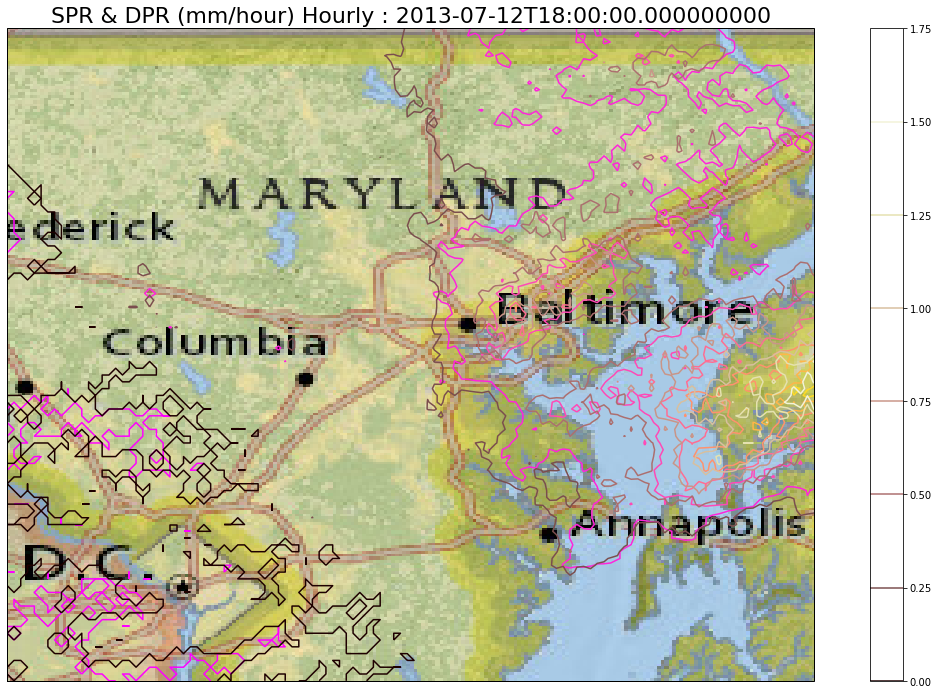

In [123]:
fig, ax = plt.subplots(figsize=(20, 12))
plt.title("HN:" + str(m3))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_image(ShadedReliefESRI(), 8)
plt.contour(lond,latd,raind, cmap = 'spring')
plt.contour(lonspr,latspr,rainspr, cmap = 'pink')
plt.title('SPR & DPR (mm/hour) Hourly : ' + str(m3), fontsize = 22)
#plt.legend('s', 'd')
plt.colorbar()
plt.savefig('SPRDPRCompare3Hourly.png')

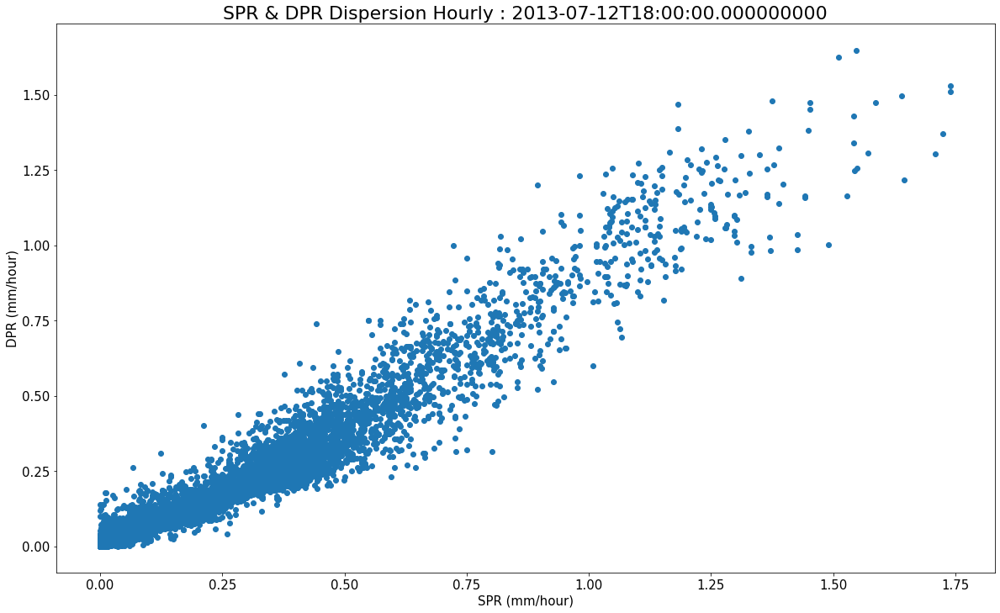

In [122]:
# not sure what this does but it looks cool, shows dispersion
fig, ax = plt.subplots(figsize = (20,12))
plt.scatter(rainspr,raind)
plt.title('SPR & DPR Dispersion Hourly : ' + str(m3), fontsize = 22)
plt.xlabel('SPR (mm/hour)', fontsize = 15)
plt.ylabel('DPR (mm/hour)', fontsize = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
#plt.description('For each latitude and longitude, the differing values of rain rate that DPR and HN have recorded')
plt.savefig('SPRDPRDispersion 3Hourly.png')


In [13]:
xr.closeall()

AttributeError: module 'xarray' has no attribute 'closeall'

In [6]:
from scipy.stats import ttest_ind
ttest_ind(rainspr,raind)


NameError: name 'rainspr' is not defined

In [29]:
# thresh = 0
# times = []
# obs = []
# for time in hourly.time.values:
#     this_hour = hourly.sel(time=time)
#     num_obs = int((this_hour.rain>thresh).sum())
#     times.append(time)
#     obs.append(num_obs)

In [30]:
thresh = 0

In [34]:
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly04

<xarray.Dataset>
Dimensions:  (time: 720, x: 120, y: 97)
Coordinates:
  * time     (time) datetime64[ns] 2000-04-01 ... 2000-04-30T23:00:00
    lat      (y) float64 ...
    lon      (x) float64 ...
Dimensions without coordinates: x, y
Data variables:
    rain     (time, y, x) float64 ...

ValueError: x and y can be no greater than 2-D, but have shapes (720,) and (720, 97, 120)

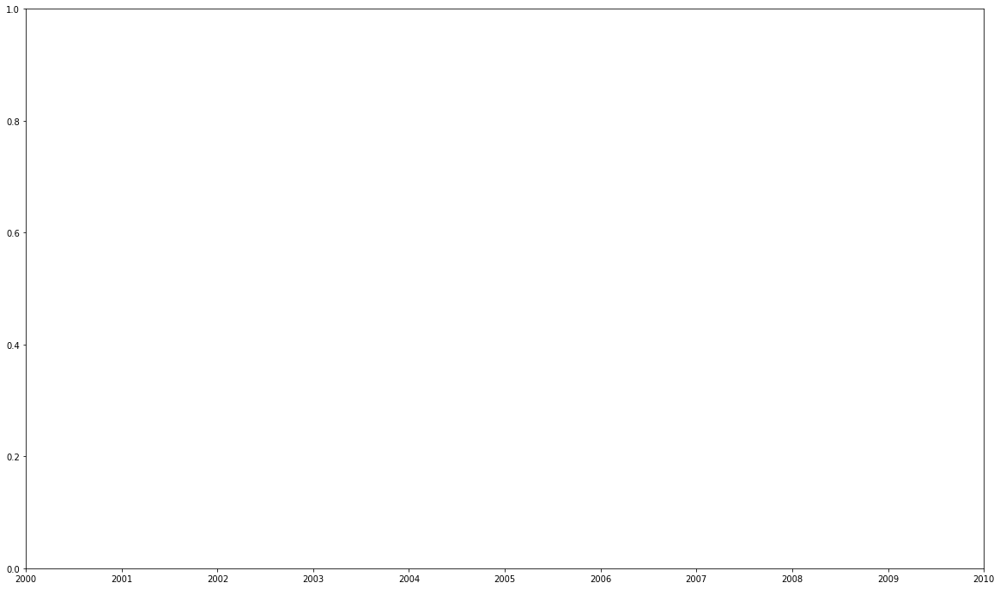

In [35]:
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(hourly04.time, hourly04.rain, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

In [31]:
year = 2000
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
# hourly2000 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
# times00 = []
# obs00 = []
# for time in hourly2000.time.values:
#     this_hour = hourly2000.sel(time=time)
#     num_obs = int((this_hour.rain>thresh).sum())
#     times00.append(time)
#     obs00.append(num_obs)
# hourly2000
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times00,obs00, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

MemoryError: Unable to allocate array with shape (4342, 97, 120) and data type float64

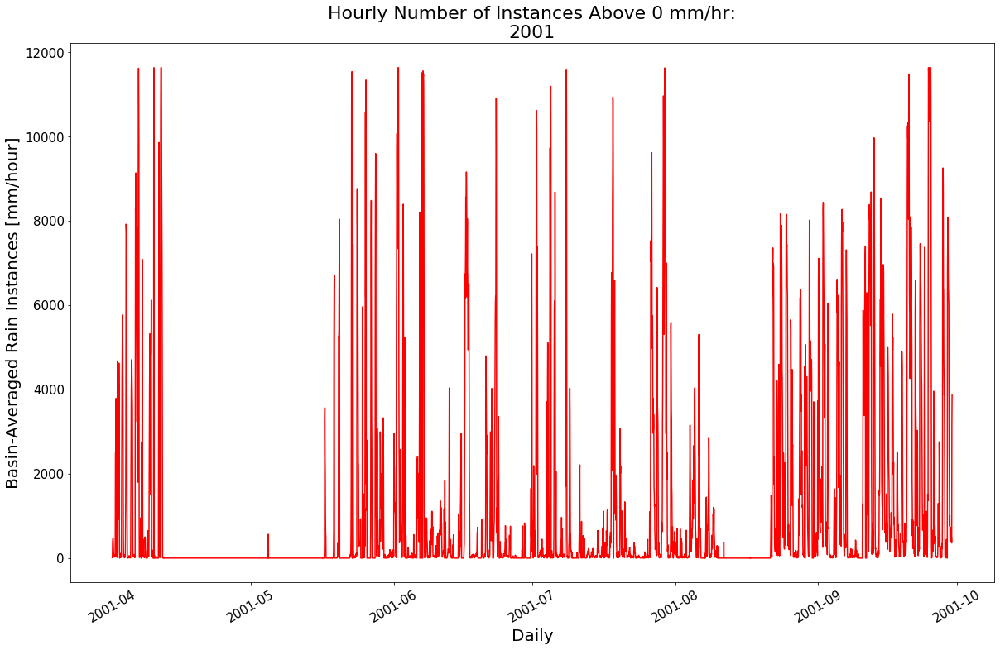

In [113]:
year = 2001
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times01 = []
obs01 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times01.append(time)
    obs01.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times01,obs01, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

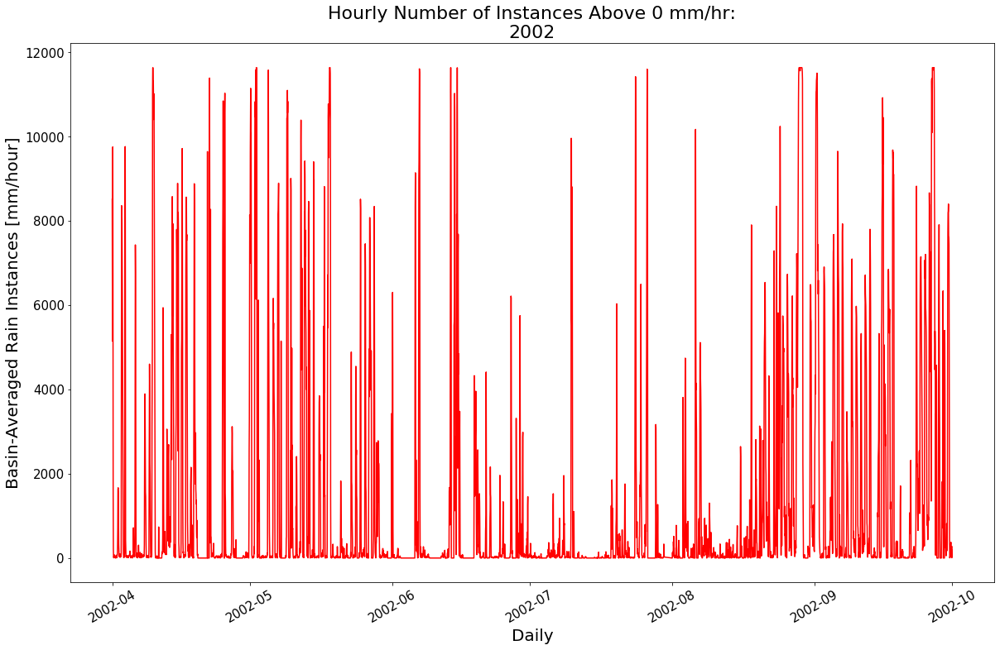

In [114]:
year = 2002
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times02 = []
obs02 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times02.append(time)
    obs02.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times02,obs02, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

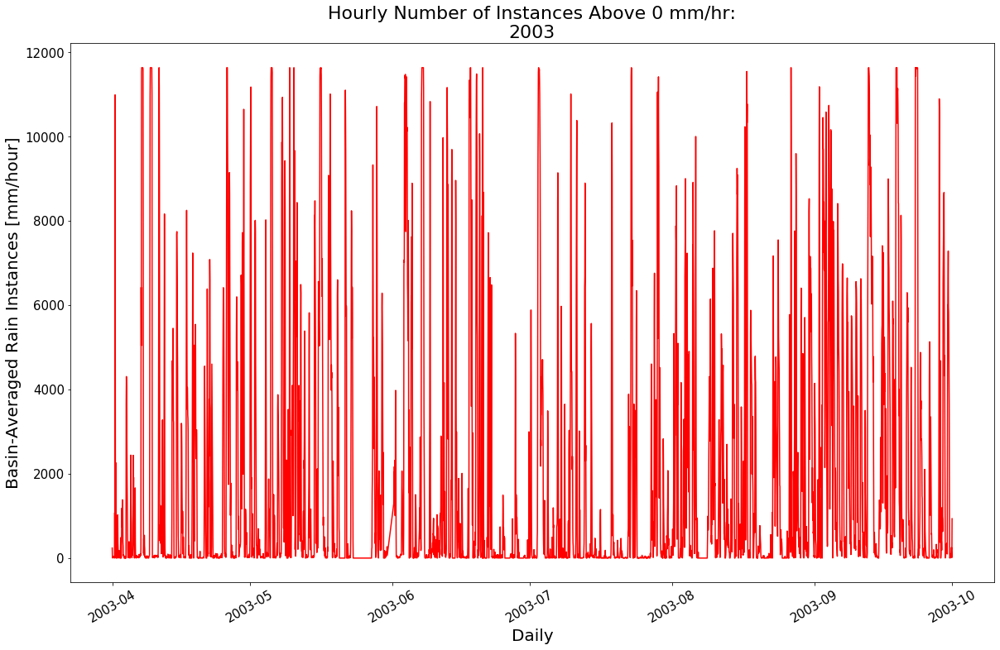

In [115]:
year = 2003
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times03 = []
obs03 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times03.append(time)
    obs03.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times03,obs03, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

In [116]:
# year = 2004
# hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
# hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
# hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
# hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
# hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
# hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
# hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
# thresh = 10
# times04 = []
# obs04 = []
# for time in hourly2001.time.values:
#     this_hour = hourly2001.sel(time=time)
#     num_obs = int((this_hour.rain>thresh).sum())
#     times04.append(time)
#     obs04.append(num_obs)
    
# fig, ax = plt.subplots(figsize=(20, 12))
# x = pd.to_datetime(str(time))
# d = x.strftime('%Y')
# plt.plot(times04,obs04, 'red')
# plt.xticks(rotation =30, fontsize = 15)
# plt.yticks(fontsize = 15)
# plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
# ax.set_xlabel('Daily', fontsize=20)
# ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
# plt.show()

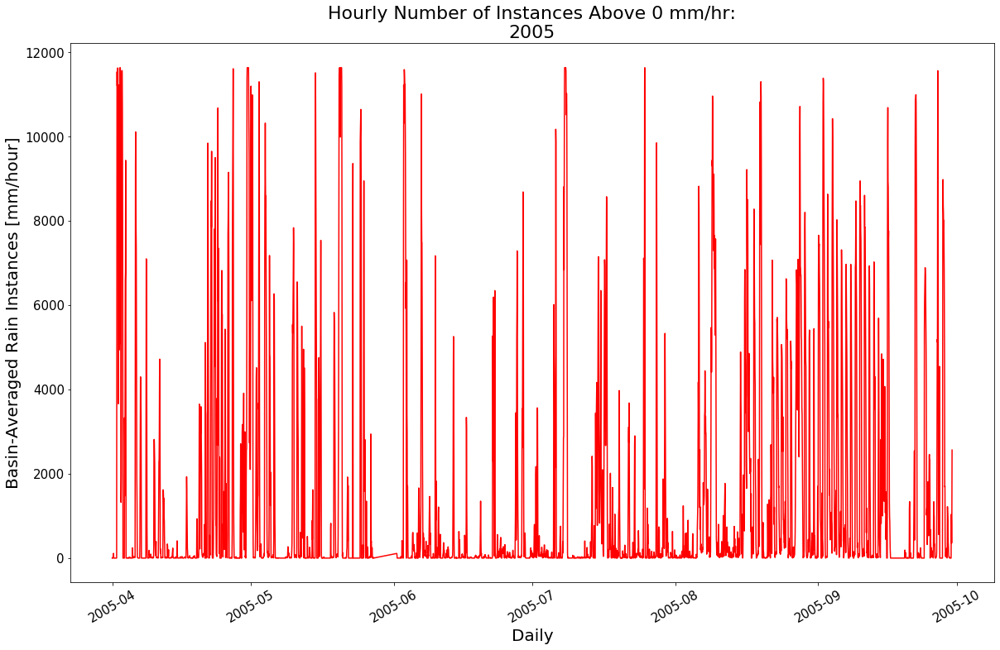

In [117]:
year = 2005
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times05 = []
obs05 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times05.append(time)
    obs05.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times05,obs05, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

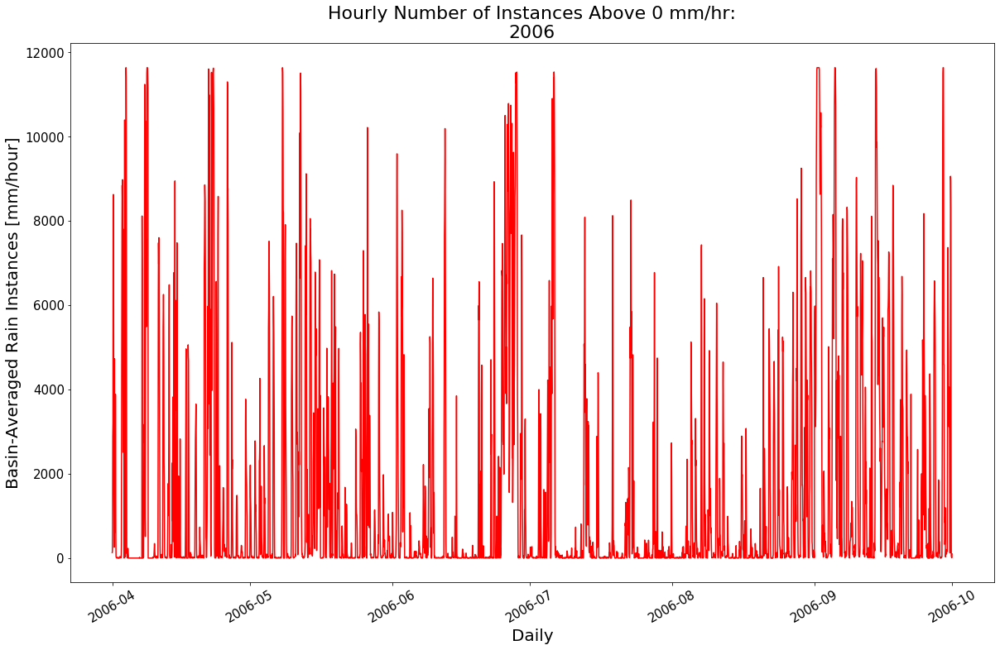

In [118]:
year = 2006
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times06 = []
obs06 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times06.append(time)
    obs06.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times06,obs06, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

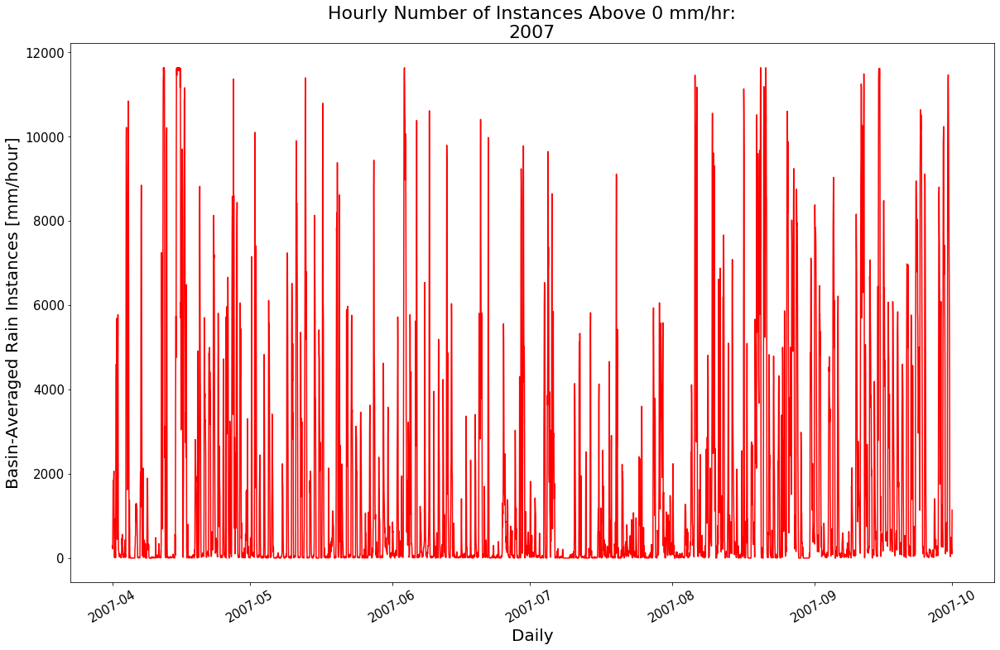

In [119]:
year = 2007
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times07 = []
obs07 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times07.append(time)
    obs07.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times07,obs07, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

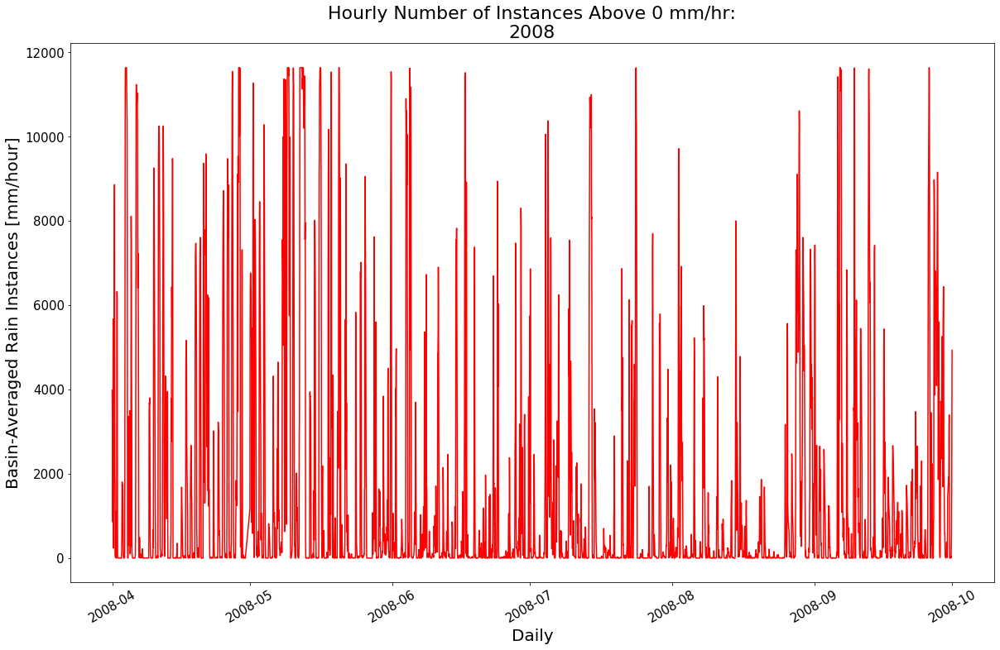

In [120]:
year = 2008
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times08 = []
obs08 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times08.append(time)
    obs08.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times08,obs08, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

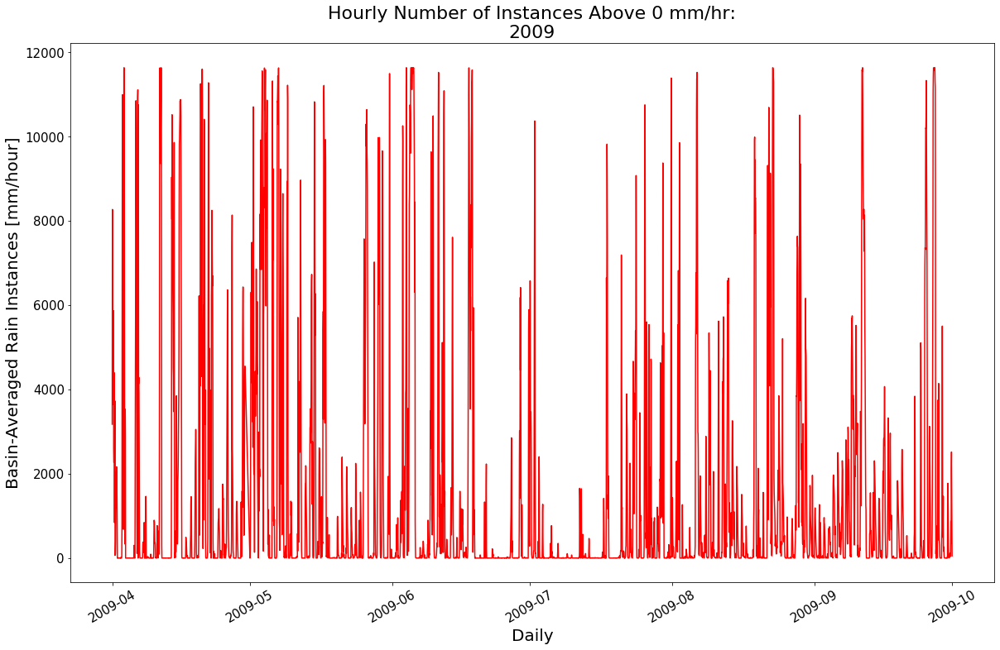

In [121]:
year = 2009
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times09 = []
obs09 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times09.append(time)
    obs09.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times09,obs09, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

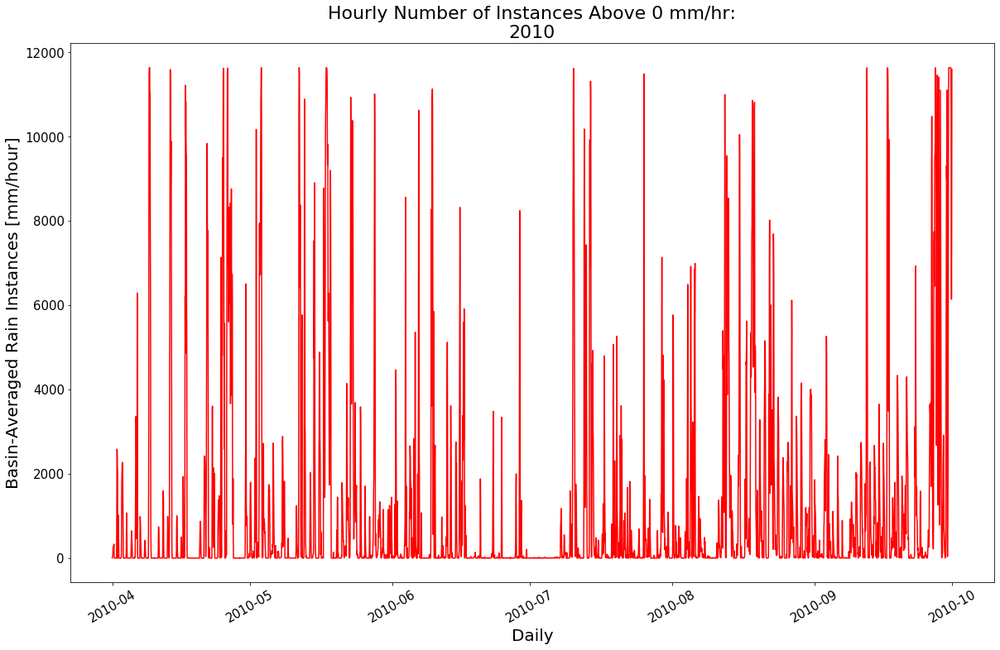

In [122]:
year = 2010
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times10 = []
obs10 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times10.append(time)
    obs10.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times10,obs10, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

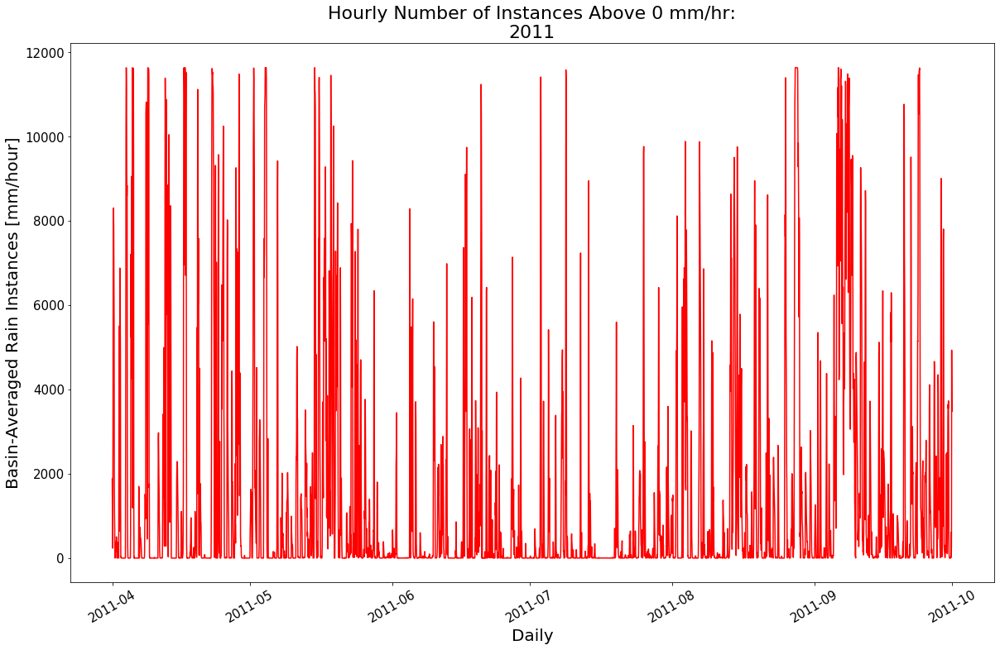

In [123]:
year = 2011
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times11 = []
obs11 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times11.append(time)
    obs11.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times11,obs11, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

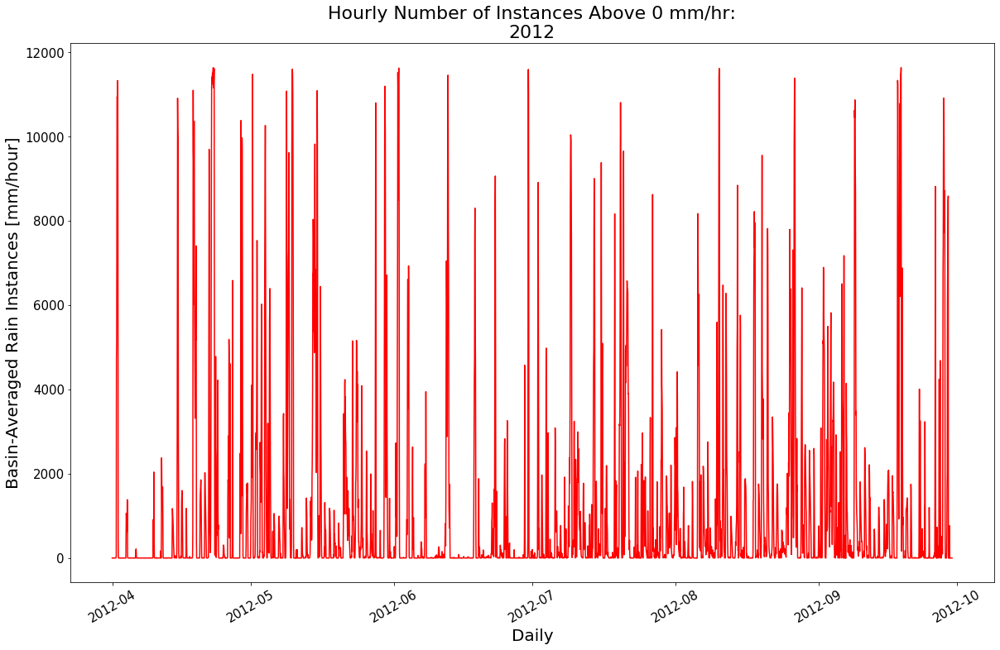

In [124]:
year = 2012
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times12 = []
obs12 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times12.append(time)
    obs12.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times12,obs12, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

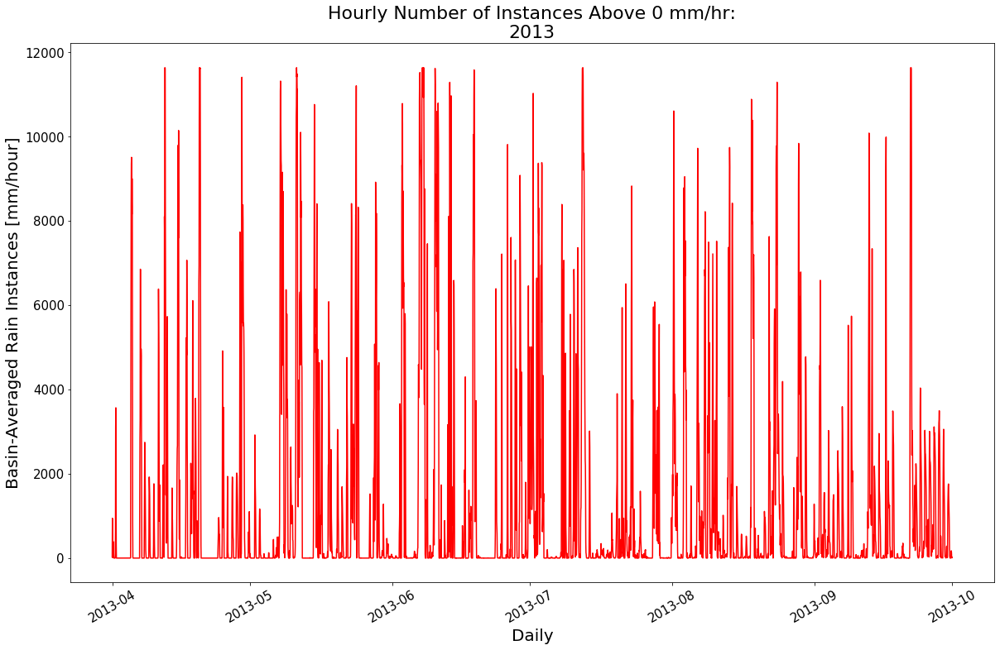

In [125]:
year = 2013
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times13 = []
obs13 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times13.append(time)
    obs13.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times13,obs13, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

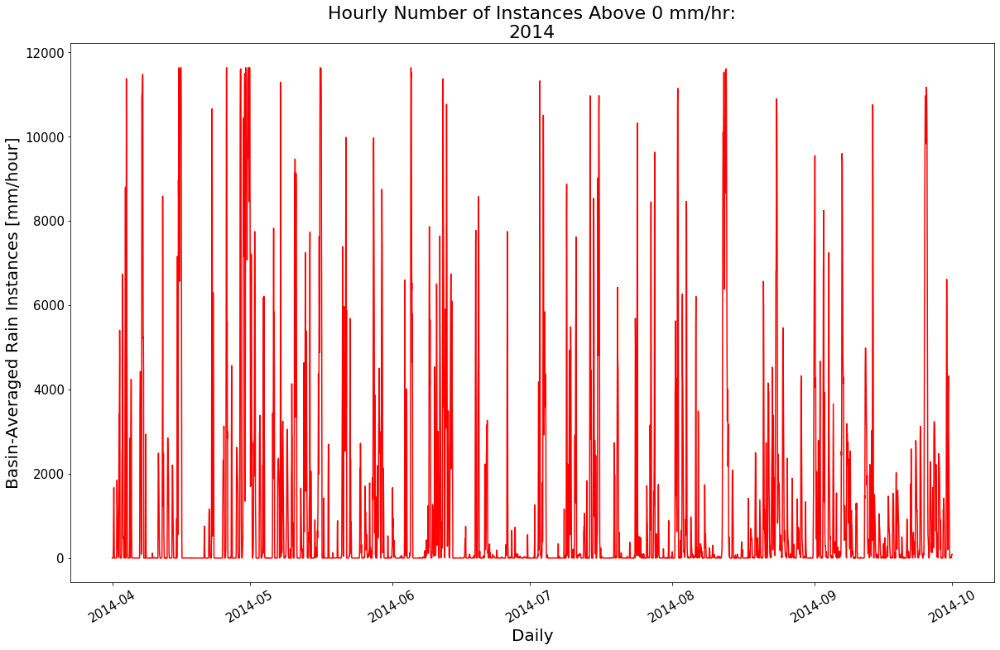

In [126]:
year = 2014
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times14 = []
obs14 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    maxrain = this_hour.max
    num_obs = int((this_hour.rain>thresh).sum())
    times14.append(time)
    obs14.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times14,obs14, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

In [27]:
year = 2015
hourly04 = xr.open_dataset(str(year) + '_04_hn_hr.nc')
hourly05 = xr.open_dataset(str(year) + '_05_hn_hr.nc')
hourly06 = xr.open_dataset(str(year) + '_06_hn_hr.nc')
hourly07 = xr.open_dataset(str(year) + '_07_hn_hr.nc')
hourly08 = xr.open_dataset(str(year) + '_08_hn_hr.nc')
hourly09 = xr.open_dataset(str(year) + '_09_hn_hr.nc')
hourly2001 = xr.concat([hourly04 ,hourly05, hourly06, hourly07, hourly08, hourly09])
times15 = []
obs15 = []
for time in hourly2001.time.values:
    this_hour = hourly2001.sel(time=time)
    num_obs = int((this_hour.rain>thresh).sum())
    times15.append(time)
    obs15.append(num_obs)
    
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(times15,obs15, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()


MemoryError: Unable to allocate array with shape (6, 4392, 97, 120) and data type float64

In [133]:
newobs = obs00 + obs01 + obs02 + obs03 + obs05 + obs06 + obs07 + obs08 + obs09 + obs10 + obs11 + obs12 + obs13 + obs14 + obs15
newtime = times00 + times01 + times02 + times03 + times05 + times06 + times07 + times08 + times09 + times10 + times11 + times12 + times13 + times14 + times15

In [136]:
d = {'Time':newtime,'obs':newobs}
df = pd.DataFrame(d)
df

,Time,obs
0,2000-04-01 00:00:00,288
1,2000-04-01 01:00:00,1376
2,2000-04-01 02:00:00,1860
3,2000-04-01 03:00:00,2203
4,2000-04-01 04:00:00,2265
...,...,...
64974,2015-09-30 19:00:00,407
64975,2015-09-30 20:00:00,1346
64976,2015-09-30 21:00:00,2133
64977,2015-09-30 22:00:00,1586


ParserError: Unknown string format: <module 'time' (built-in)>

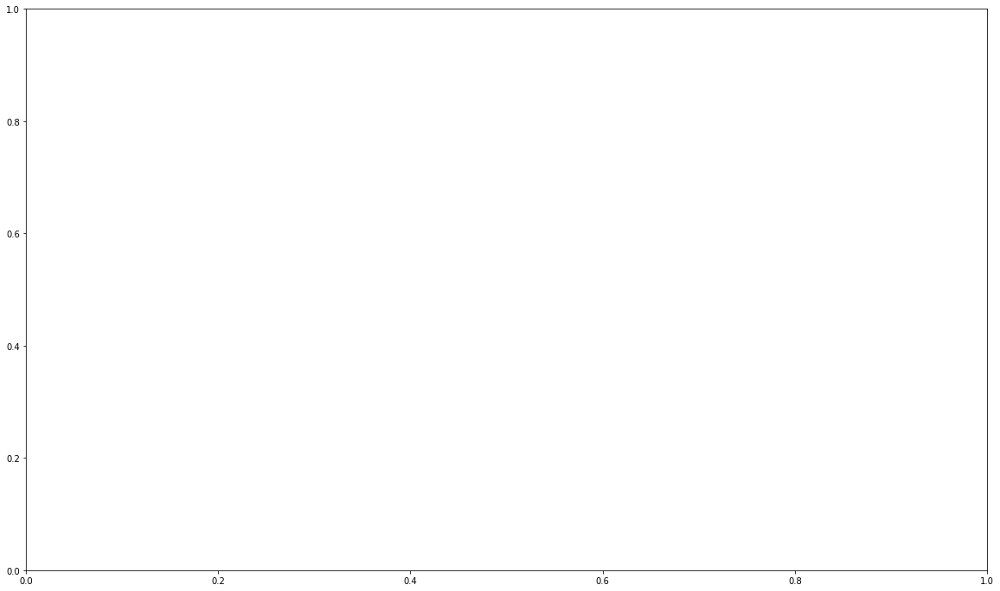

In [146]:
fig, ax = plt.subplots(figsize=(20, 12))
x = pd.to_datetime(str(time))
d = x.strftime('%Y')
plt.plot(newtime,newobs, 'red')
plt.xticks(rotation =30, fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Hourly Number of Instances'+ ' Above ' + str(thresh) + ' mm/hr:\n' + d , fontsize = 22)
ax.set_xlabel('Daily', fontsize=20)
ax.set_ylabel("Basin-Averaged Rain Instances [mm/hour]", fontsize=20)
plt.show()

In [143]:
timet = []
obst = []
i = 0
for obs in newobs:
    if (obs != (0)):
        obst.append(obs)
        timet.append(int(newtime[i]))
    i = i + 1
    
    

In [145]:
import plotly.express as px
fig = px.scatter(x = timet, y = obst, trendline = "ols")
fig.show()

In [ ]:
thresh = 20
times = []
obs = []
for lat in hourly.lat.values:
    this_lat = hourly.sel(lat=lat)
    for lon in hourly.lon.values:
        this_lon = hourly.sel(lon=lon)
        num_obs = int(([this_lat, this_lon].rain>thresh).sum())
    #.append(time)
        obs.append(num_obs)

In [ ]:
ax = plt.axes(projection=ccrs.PlateCarree()) #,xlim=[-76.3, -76.1], ylim=[38.7, 38.9])
#ax.set_xticks(np.arange(-76.3,-76.1,0.1))
#ax.set_yticks(np.arange(38.7,38.9,0.1))
plt.contour(lon,lat,obs, cmap = 'pink')
ax.add_image(ShadedReliefESRI(), 8)
plt.title("HN:" + str(time))
plt.colorbar()

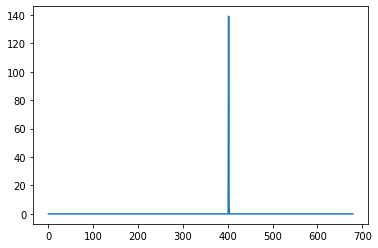

In [159]:
plt.plot(obs)

In [ ]:
thresh = 5
(ds.rain>thresh).sum()

In [ ]:
# sum above threshold histogram!
thresh =50;
i=0
for path in grid_path06:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        hns = mm.variables['rain'][:]
        hns[hns<thresh] =0.;
        hns[hns>=thresh] =1.;
    if i > 0: 
        hnns = mm.variables['rain'][:]    
        hnns[hnns<thresh] = 0.;
        hnns[hnns>=thresh] = 1.;
        hns = hns + hnns;
    i=i+1
    

In [ ]:
#total rainfall sum to graph
i=0
thresh = 5
month = june
for path in grid_path06:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        hn = mm.variables['rain'][:]
        hn[hn<thresh] =0.;
    if i > 0: 
        hnn = mm.variables['rain'][:]    
        hnn[hnn<thresh] = 0.;
        hn = hn + hnn;
    i=i+1

In [ ]:
ax = plt.axes(projection=ccrs.PlateCarree())
#ax.set_xticks(np.arange(-76.3,-76.1,0.1))
#ax.set_yticks(np.arange(38.7,38.9,0.1))
plt.title("threshold " + str(thresh) + " in " + str(month))
plt.contourf(lonh,lath,hn,levels=levels)
ax.add_image(ShadedReliefESRI(), 8)
plt.colorbar()
levels=[10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
#levels=[100,200,300,400,500,600,700,800,900,1000,1100,1200]
#levels=[100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850]
# plt.colorbar()

In [ ]:
#total rainfall sum to graph
i=0
thresh = 5
for path in grid_path06:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        hn = mm.variables['rain'][:]
        time = mm.variables['year'][:]
        hn[hn<thresh] =0.;
    if i > 0: 
        hnn = mm.variables['rain'][:]    
        hnn[hnn<thresh] = 0.;
        hn = hn + hnn;
    i=i+1

In [ ]:
time

## Plot months side-by-side

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

levels=[100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950]   
levels=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16] 
levels=[0,1,2,3,4,5,6,7,8]
fig = plt.figure(figsize=(20,8))

ax1 = fig.add_subplot(1,2,1)
plt.contourf(lonh,lath,hn,levels=levels)
plt.title("HydroNEXRAD",fontsize="18")
plt.colorbar()

# subplot number 2
ax2 = fig.add_subplot(1,2,2)
plt.contourf(lond,latd,dpr, levels = levels)
plt.colorbar()
plt.title("DPR",fontsize="18")
#plt.savefig('/data1/KLWX/IMAGES/June_cont.jpg')


#plt.title("DPR, August2012-2015",fontsize="18")
#plt.savefig('/data1/KLWX/IMAGES/Aug_cont.jpg')
#plt.title("DPR, July2012-2015",fontsize="18")
#plt.savefig('/data1/KLWX/IMAGES/July_cont.jpg')


## Plot differences

In [ ]:
fig = plt.figure(figsize=(9,8))
#levels=[-150,-140,-130,-120,-110,-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
levels=[-5,-4,-3,-2,-1,0,1,2,3,4,5]
plt.contourf(lonh,lath,(hn-(dpr)),cmap='seismic',levels=levels)
plt.colorbar()
plt.title("HN-DPR",fontsize="18")
#plt.savefig('/data1/KLWX/IMAGES/June_HN-DPR.jpg')

## Compute thresholded summaries

In [ ]:
# DPR
ofile = open('/data1/Level3/KLWX/KLWXDPRSum.txt','w')
for j in range(0,len(grid_pathd)):
    m2 = Dataset(grid_pathd[j])
    lat2 = m2.variables['lat'][:]
    lon2 = m2.variables['lon'][:]
    dpr = m2.variables['dpr'][:]
    dpr[np.isnan(dpr)] = 0.
    myear = m2.variables['year'][:]
    mmonth = m2.variables['month'][:]
    mday = m2.variables['day'][:]
    mhour = m2.variables['hour'][:]
    mminute = m2.variables['minute'][:]

    dd1 = float(np.sum(dpr>0.0))
    dd2 = float(np.sum(dpr>=5.0/4.))
    dd3 = float(np.sum(dpr>=10.0/4.))
    dd4 = float(np.sum(dpr>=25.0/4.))
    dd5 = float(np.sum(dpr>=50.0/4.))
    dd6 = float(np.sum(dpr>=100.0/4.))
    dd7 = float(np.sum(dpr>=125.0/4.))
    dd8 = float(np.sum(dpr>=150.0/4.))
    dd9 = float(np.sum(dpr>=175.0/4.))
    dd10 = float(np.sum(dpr>=195.0/4.))
    dd11 = float(np.sum(dpr>=200.0/4.))
    ofile.write("%4d, " % myear)
    ofile.write("%2d, " % mmonth)
    ofile.write("%2d, " % mday)
    ofile.write("%2d, " % mhour)
    ofile.write("%2d, " % mminute)
    ofile.write("%6d, " % dd1)
    ofile.write("%6d, " % dd2)
    ofile.write("%6d, " % dd3)
    ofile.write("%6d, " % dd4)
    ofile.write("%6d, " % dd5)
    ofile.write("%6d, " % dd6)
    ofile.write("%6d, " % dd7)
    ofile.write("%6d, " % dd8)
    ofile.write("%6d, " % dd9)
    ofile.write("%6d, " % dd10)
    ofile.write("%6d\n" % dd11)
ofile.close()

In [ ]:
# HN
ofile = open('/data1/Level3/KLWX/KLWXHNSum.txt','w')
for j in range(0,len(grid_pathh)):
    m2 = Dataset(grid_pathh[j])
    lat2 = m2.variables['lat'][:]
    lon2 = m2.variables['lon'][:]
    rain = m2.variables['rain'][:]
    rain[np.isnan(rain)] = 0.
    myear = m2.variables['year'][:]
    mmonth = m2.variables['month'][:]
    mday = m2.variables['day'][:]
    mhour = m2.variables['hour'][:]
    mminute = m2.variables['minute'][:]

    dd1 = float(np.sum(rain>0.0))
    dd2 = float(np.sum(rain>=5./4.))
    dd3 = float(np.sum(rain>=10./4.))
    dd4 = float(np.sum(rain>=25.0/4.))
    dd5 = float(np.sum(rain>=50.0/4.))
    dd6 = float(np.sum(rain>=100.0/4.))
    dd7 = float(np.sum(rain>=125.0/4.))
    dd8 = float(np.sum(rain>=150.0/4.))
    dd9 = float(np.sum(rain>=175.0/4.))
    dd10 = float(np.sum(rain>=195.0/4.))
    dd11 = float(np.sum(rain>=200.0/4.))
    ofile.write("%4d, " % myear)
    ofile.write("%2d, " % mmonth)
    ofile.write("%2d, " % mday)
    ofile.write("%2d, " % mhour)
    ofile.write("%2d, " % mminute)
    ofile.write("%6d, " % dd1)
    ofile.write("%6d, " % dd2)
    ofile.write("%6d, " % dd3)
    ofile.write("%6d, " % dd4)
    ofile.write("%6d, " % dd5)
    ofile.write("%6d, " % dd6)
    ofile.write("%6d, " % dd7)
    ofile.write("%6d, " % dd8)
    ofile.write("%6d, " % dd9)
    ofile.write("%6d, " % dd10)
    ofile.write("%6d\n" % dd11)
ofile.close()


In [ ]:
float(np.sum(dpr>0.0))

## Read  summary files

### Summary HN read

In [ ]:
sumHNfile = '/data1/Level3/KLWX/KLWXHNSum.txt'
names = ['year', 'month','day','hour','minute','dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200']
HNsum = pd.read_csv(sumHNfile, names=names)
format = '%Y%m%d%H%M'
HNsum['Datetime'] = pd.to_datetime(HNsum[['year','month','day','hour','minute']])
HNsum = HNsum.set_index(['Datetime'])


In [ ]:
HNtot = len(HNsum.year)
HNtot

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
plt.figure(figsize=(30,5))
plt.plot(HNsum['dd25']/HNtot,color='red')
rmin = 0;
rmax = .025;
plt.ylim(rmin,rmax)
plt.xlim(
    xmin=datetime(2012, 4, 1, hour=0), 
    xmax=datetime(2012, 9, 30, hour=23))
plt.gcf().autofmt_xdate()
#plt.show()

### Summary DPR read

In [ ]:
sumDPRfile = '/data1/Level3/KLWX/KLWXDPRSum.txt'
names = ['year', 'month','day','hour','minute','dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200']
DPRsum = pd.read_csv(sumDPRfile, names=names)
format = '%Y%m%d%H%M'
DPRsum['Datetime'] = pd.to_datetime(DPRsum[['year','month','day','hour','minute']])
DPRsum = DPRsum.set_index(['Datetime'])


In [ ]:
DPRtot = len(DPRsum.year)
DPRtot

## Create plots

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
fig, (ax1, ax2) = plt.subplots(2,sharex=True, sharey=True,figsize=(30,10))
fig.suptitle('%grids > 25 mm/h')
ax1.plot(DPRsum['dd25']/DPRtot,color='blue')
ax2.plot(HNsum['dd25']/HNtot,color='red')
for ax in fig.get_axes():
    ax.label_outer()
plt.gcf().autofmt_xdate()
rmin = 0;
rmax = .025;
plt.ylim(rmin,rmax)
plt.xlim(
   xmin=datetime(2015, 4, 1, hour=0), 
   xmax=datetime(2015, 9, 30, hour=23))
#plt.gcf().autofmt_xdate()
#plt.show()

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
rmin = 0;
rmax = 3000;
#plt.plot(HNsum['dd00'],color='red')
#plt.plot(DPRsum['dd00'],color='blue')
plt.plot(HNsum['dd05'],color='red')
plt.plot(DPRsum['dd05'],color='blue')
plt.plot(HNsum['dd10'],color='red')
plt.plot(DPRsum['dd10'],color='blue')

plt.ylim(rmin,rmax)
plt.xlim(
    xmin=datetime(2013, 6, 10, hour=1), 
    xmax=datetime(2013, 6, 10, hour=23))
plt.gcf().autofmt_xdate()
#plt.show()

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
rmin = 0;
rmax = 600;
plt.plot(HNsum['dd25'],color='red')
plt.plot(DPRsum['dd25'],color='blue')
plt.plot(HNsum['dd50'],color='red')
plt.plot(DPRsum['dd50'],color='blue')
plt.plot(HNsum['dd100'],color='green')
plt.plot(DPRsum['dd100'],color='black')

plt.ylim(rmin,rmax)
plt.xlim(
    xmin=datetime(2013, 6, 10, hour=1), 
    xmax=datetime(2013, 6, 10, hour=23))
plt.gcf().autofmt_xdate()
#plt.show()

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
rmin = 0;
rmax = 20;
plt.plot(HNsum['dd100'],color='red')
plt.plot(DPRsum['dd100'],color='blue')
plt.plot(HNsum['dd150'],color='red')
plt.plot(DPRsum['dd150'],color='blue')
plt.plot(HNsum['dd200'],color='green')
plt.plot(DPRsum['dd200'],color='black')

plt.ylim(rmin,rmax)
plt.xlim(
    xmin=datetime(2013, 6, 10, hour=1), 
    xmax=datetime(2013, 6, 10, hour=23))
plt.gcf().autofmt_xdate()
#plt.show()

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
plt.plot(HNsum['dd150']/HNtot,color='red')
plt.plot(DPRsum['dd150']/DPRtot,color='blue')

plt.plot(DPRsum['dd175']/DPRtot,color='black')
plt.plot(HNsum['dd175']/HNtot,color='green')
rmin = 0;
rmax = .0001;
plt.ylim(rmin,rmax)
plt.xlim(
    xmin=datetime(2012, 4, 1, hour=0), 
    xmax=datetime(2015, 9, 30, hour=23))
plt.gcf().autofmt_xdate()
#plt.show()

In [ ]:
%matplotlib inline
#'dd00','dd05','dd10','dd25','dd50','dd100','dd125','dd150','dd175','dd195','dd200' (mm/hr)
plt.plot(DPRsum['dd10']/DPRtot,color='red')
plt.plot(DPRsum['dd50']/DPRtot,color='blue')
plt.plot(DPRsum['dd100']/DPRtot,color='green')
plt.plot(DPRsum['dd125']/DPRtot,color='yellow')
plt.plot(DPRsum['dd175']/DPRtot,color='black')

plt.xlim(
    xmin=datetime(2013, 4, 1, hour=0), 
    xmax=datetime(2013, 9, 30, hour=23))
plt.gcf().autofmt_xdate()
#plt.show()

## Read and plot HN 2000-2009

In [ ]:
import os
import fnmatch
import glob
grid_pathh = []
grid_path2000 = []
grid_path2001 = []
grid_path2002 = []
grid_path2003 = []
grid_path2004 = []
grid_path2005 = []
grid_path2006 = []
grid_path2007 = []
grid_path2008 = []
grid_path2009 = []

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2000/'):
    grid_path04 += glob.glob(os.path.join(root, '200004*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200005*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200006*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200007*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200008*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200009*.nc'))
grid_path2000 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200006 = grid_path06
grid_path200007 = grid_path07
grid_path2010008 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2001/'):
    grid_path04 += glob.glob(os.path.join(root, '200104*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200105*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200106*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200107*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200108*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200109*.nc'))
grid_path2001 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200106 = grid_path06
grid_path200107 = grid_path07
grid_path200108 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2002/'):
    grid_path04 += glob.glob(os.path.join(root, '200204*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200205*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200206*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200207*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200208*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200209*.nc'))
grid_path2002 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200206 = grid_path06
grid_path200207 = grid_path07
grid_path200208 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2003/'):
    grid_path04 += glob.glob(os.path.join(root, '200304*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200305*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200306*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200307*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200308*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200309*.nc'))
grid_path2003 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200306 = grid_path06
grid_path200307 = grid_path07
grid_path200308 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2004/'):
    grid_path04 += glob.glob(os.path.join(root, '200404*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200405*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200406*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200407*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200408*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200409*.nc'))
grid_path2004 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200406 = grid_path06
grid_path200407 = grid_path07
grid_path200408 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2005/'):
    grid_path04 += glob.glob(os.path.join(root, '200504*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200505*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200506*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200507*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200508*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200509*.nc'))
grid_path2005 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200506 = grid_path06
grid_path200507 = grid_path07
grid_path200508 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2006/'):
    grid_path04 += glob.glob(os.path.join(root, '200604*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200605*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200606*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200607*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200608*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200609*.nc'))
grid_path2006 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200606 = grid_path06
grid_path200607 = grid_path07
grid_path200608 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2007/'):
    grid_path04 += glob.glob(os.path.join(root, '200704*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200705*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200706*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200707*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200708*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200709*.nc'))
grid_path2007 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200706 = grid_path06
grid_path200707 = grid_path07
grid_path200708 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2008/'):
    grid_path04 += glob.glob(os.path.join(root, '200804*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200805*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200806*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200807*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200808*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200809*.nc'))
grid_path2008 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200806 = grid_path06
grid_path200807 = grid_path07
grid_path200808 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2009/'):
    grid_path04 += glob.glob(os.path.join(root, '200904*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '200905*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '200906*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '200907*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '200908*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '200909*.nc'))
grid_path2009 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path200906 = grid_path06
grid_path200907 = grid_path07
grid_path200908 = grid_path08

#grid_pathh = grid_path2012 + grid_path2013 + grid_path2014 + grid_path2015
grid_pathh = grid_path200007 + grid_path200107 + grid_path200207 + grid_path200307 + grid_path200407 + grid_path200507 + grid_path200607 + grid_path200707 +grid_path200807 + grid_path200907;
#grid_pathh = grid_path201207 + grid_path201307 + grid_path201407 + grid_path201507;
#grid_pathh = grid_path201208 + grid_path201308 + grid_path201408 + grid_path201508;
grid_pathh.sort()
grid_pathh
HNtot = len(grid_pathh)

In [ ]:
grid_pathh

In [ ]:
#rainfall sum
i=0
for path in grid_pathh:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        hn = mm.variables['rain'][:]
        hn[hn<0] =0.;
    if i > 0: 
        hnn = mm.variables['rain'][:]    
        hnn[hnn<0] = 0.;
        hn = hn + hnn;
    i=i+1
    

In [ ]:
# sum above threshold
thresh =25./4.;
i=0
for path in grid_pathh:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        hn = mm.variables['rain'][:]
        hn[hn<thresh] =0.;
        hn[hn>=thresh] =1.;
    if i > 0: 
        hnn = mm.variables['rain'][:]    
        hnn[hnn<thresh] = 0.;
        hnn[hnn>=thresh] = 1.;
        hn = hn + hnn;
    i=i+1
    

## read HN 2010-2011, DPR 2012-2019

In [ ]:
import os
import fnmatch
import glob
grid_pathd = []
grid_path2010 = []
grid_path2011 = []
grid_path2012 = []
grid_path2013 = []
grid_path2014 = []
grid_path2015 = []
grid_path2016 = []
grid_path2017 = []
grid_path2018 = []
grid_path2019 = []


grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2010/'):
    grid_path04 += glob.glob(os.path.join(root, '201004*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201005*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201006*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201007*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201008*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201009*.nc'))
grid_path2010 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201006 = grid_path06
grid_path201007 = grid_path07
grid_path201008 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/HN/2011/'):
    grid_path04 += glob.glob(os.path.join(root, '201104*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201105*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201106*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201107*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201108*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201109*.nc'))
grid_path2011 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201106 = grid_path06
grid_path201107 = grid_path07
grid_path201108 = grid_path08


grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2012/'):
    grid_path04 += glob.glob(os.path.join(root, '201204*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201205*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201206*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201207*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201208*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201209*.nc'))
grid_path2012 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201206 = grid_path06
grid_path201207 = grid_path07
grid_path201208 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2013/'):
    grid_path04 += glob.glob(os.path.join(root, '201304*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201305*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201306*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201307*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201308*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201309*.nc'))
grid_path2013 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201306 = grid_path06
grid_path201307 = grid_path07
grid_path201308 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2014/'):
    grid_path04 += glob.glob(os.path.join(root, '201404*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201405*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201406*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201407*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201408*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201409*.nc'))
grid_path2014 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201406 = grid_path06
grid_path201407 = grid_path07
grid_path201408 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2015/'):
    grid_path04 += glob.glob(os.path.join(root, '201504*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201505*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201506*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201507*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201508*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201509*.nc'))
grid_path2015 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201506 = grid_path06
grid_path201507 = grid_path07
grid_path201508 = grid_path08



grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2016/'):
    grid_path04 += glob.glob(os.path.join(root, '201604*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201605*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201606*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201607*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201608*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201609*.nc'))
grid_path2016 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201606 = grid_path06
grid_path201607 = grid_path07
grid_path201608 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2017/'):
    grid_path04 += glob.glob(os.path.join(root, '201704*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201705*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201706*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201707*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201708*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201709*.nc'))
grid_path2017 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201706 = grid_path06
grid_path201707 = grid_path07
grid_path201708 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2018/'):
    grid_path04 += glob.glob(os.path.join(root, '201804*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201805*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201806*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201807*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201808*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201809*.nc'))
grid_path2018 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201806 = grid_path06
grid_path201807 = grid_path07
grid_path201808 = grid_path08

grid_path04 = []
grid_path05 = []
grid_path06 = []
grid_path07 = []
grid_path08 = []
grid_path09 = []
for root, dirs, files in os.walk('/data1/Level3/KLWX/GRID_15min/DPR/2019/'):
    grid_path04 += glob.glob(os.path.join(root, '201904*.nc'))
    grid_path05 += glob.glob(os.path.join(root, '201905*.nc'))
    grid_path06 += glob.glob(os.path.join(root, '201906*.nc'))
    grid_path07 += glob.glob(os.path.join(root, '201907*.nc'))
    grid_path08 += glob.glob(os.path.join(root, '201908*.nc'))
    grid_path09 += glob.glob(os.path.join(root, '201909*.nc'))
grid_path2019 = grid_path04 + grid_path05 + grid_path06 + grid_path07 + grid_path08 + grid_path09;
grid_path201906 = grid_path06
grid_path201907 = grid_path07
grid_path201908 = grid_path08


#grid_pathd = grid_path2012 + grid_path2013 + grid_path2014 + grid_path2015;
grid_pathd = grid_path201207 + grid_path201307 + grid_path201407 + grid_path201507 +  grid_path201607 + grid_path201707 + grid_path201807 + grid_path201907;
grid_pathth = grid_path201007 + grid_path201107;
#grid_pathd = grid_path201207 + grid_path201307 + grid_path201407 + grid_path201507;
#grid_pathd = grid_path201208 + grid_path201308 + grid_path201408 + grid_path201508;
grid_pathth.sort()
grid_pathd.sort()
DPRtot = len(grid_pathd)


In [ ]:
grid_pathd

In [ ]:
#rainfall sum
i=0
for path in grid_pathth:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        thn = mm.variables['rain'][:]
        thn[thn<0] =0.;
    if i > 0: 
        thnn = mm.variables['rain'][:]    
        thnn[thnn<0] = 0.;
        thn = thn + thnn;
    i=i+1
    

In [ ]:
#  Rainfall sum
i=0
for path in grid_pathd:
    mm = Dataset(path)
    if i == 0:    
        latd = mm.variables['lat'][:]
        lond = mm.variables['lon'][:]
        dpr = mm.variables['dpr'][:]
        dpr[dpr<0] = 0.;
    if i > 0: 
        ddd = mm.variables['dpr'][:]    
        ddd[ddd<0] = 0.;
        dpr = dpr + ddd;
    i=i+1

In [ ]:
# sum above threshold
thresh =25./4.;
i=0
for path in grid_pathth:
    mm = Dataset(path)
    if i == 0:    
        lath = mm.variables['lat'][:]
        lonh = mm.variables['lon'][:]
        thn = mm.variables['rain'][:]
        thn[thn<thresh] =0.;
        thn[thn>=thresh] =1.;
    if i > 0: 
        thnn = mm.variables['rain'][:]    
        thnn[thnn<thresh] = 0.;
        thnn[thnn>=thresh] = 1.;
        thn = thn + thnn;
    i=i+1
    

In [ ]:
# sum above a threshold
thresh=25./4.;
i=0
for path in grid_pathd:
    mm = Dataset(path)
    if i == 0:    
        latd = mm.variables['lat'][:]
        lond = mm.variables['lon'][:]
        dpr = mm.variables['dpr'][:]
        dpr[dpr<thresh] = 0.;
        dpr[dpr>=thresh] = 1.;
    if i > 0: 
        ddd = mm.variables['dpr'][:]    
        ddd[ddd<thresh] = 0.;
        ddd[ddd>=thresh] = 1.;
        dpr = dpr + ddd;
    i=i+1

In [ ]:
fgrid = thn + dpr;

## Plot time periods side-by-side

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

#levels=[100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950]   
#levels=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16] 
#levels=[0,2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40] 
#levels=[0,5,10,15,20,25,30,35,40,45,50]
#levels=[0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160]
levels = np.arange(60,160,10)
fig = plt.figure(figsize=(20,8))

ax1 = fig.add_subplot(1,2,1)
plt.contour(lonh,lath,hn/4.,levels=levels,cmap='jet',vmin=60, vmax=180,extend='neither')
plt.title("2000-2009",fontsize="18")
plt.colorbar()

# subplot number 2
ax2 = fig.add_subplot(1,2,2)
levels = np.arange(60,160,10)
plt.contour(lond,latd,dpr/4.,levels=levels,cmap='jet',vmin=60, vmax=180,extend='neither')
plt.colorbar()
plt.title("2010-2019",fontsize="18")
#plt.savefig('/data1/KLWX/IMAGES/June_cont.jpg')



## plot on a map

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.img_tiles import GoogleTiles
import scipy.ndimage as ndimage
from cartopy.feature import ShapelyFeature
from cartopy.io.shapereader import Reader
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
%matplotlib inline

class ShadedReliefESRI(GoogleTiles):
#    # shaded relief
   def _image_url(self, tile):
        x, y, z = tile
        url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
               'NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}.jpg').format(
              z=z, y=y, x=x)

        return url

states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

fig = plt.figure(figsize=(12,12))

#Baltimore area
ax = plt.axes(projection=ccrs.PlateCarree(),xlim=[-77.4, -76.1], ylim=[38.8, 39.7])
ax.set_xticks(np.arange(-77.4,-76.1,0.1))
ax.set_yticks(np.arange(38.8,39.7,0.1))

ax.grid(True)
ticklines = ax.get_xticklines() + ax.get_yticklines()
gridlines = ax.get_xgridlines() + ax.get_ygridlines()
ticklabels = ax.get_xticklabels() + ax.get_yticklabels()


ax.add_image(ShadedReliefESRI(), 8)

#levels=[0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
levels = np.arange(90,180,10)
line_widths = (4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0)


hns = ndimage.gaussian_filter(hn/4., sigma=1.1, order=0)
#CS = plt.contourf(lonh,lath,hn/10.,levels=levels,cmap='hsv')
plt.contour(lonh,lath,hns,levels=levels,linewidths=3.0,cmap='jet')
plt.colorbar(shrink=0.5)
plt.title("HydroNEXRAD, 2012-2015",fontsize="18")
#CB=plt.colorbar(CS,shrink=0.5)
#CB.ax.set_ylabel('Rain, mm',fontsize=16)
#CB.ax.set_yticklabels(np.arange(0,150,10),fontsize=16)

In [ ]:
5.1*31

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.img_tiles import GoogleTiles
import scipy.ndimage as ndimage
from cartopy.feature import ShapelyFeature
from cartopy.io.shapereader import Reader
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
%matplotlib inline

class ShadedReliefESRI(GoogleTiles):
#    # shaded relief
   def _image_url(self, tile):
        x, y, z = tile
        url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
               'NatGeo_World_Map/MapServer/tile/{z}/{y}/{x}.jpg').format(
              z=z, y=y, x=x)

        return url

states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

fig = plt.figure(figsize=(12,12))

#Baltimore area
ax = plt.axes(projection=ccrs.PlateCarree(),xlim=[-77.3, -76.1], ylim=[38.8, 39.7])
ax.set_xticks(np.arange(-77.3,-76.1,0.1))
ax.set_yticks(np.arange(38.8,39.7,0.1))

ax.grid(True)
ticklines = ax.get_xticklines() + ax.get_yticklines()
gridlines = ax.get_xgridlines() + ax.get_ygridlines()
ticklabels = ax.get_xticklabels() + ax.get_yticklabels()


ax.add_image(ShadedReliefESRI(), 8)

#levels=[0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
levels = np.arange(90,180,10)
line_widths = (4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0)

dprs = ndimage.gaussian_filter(dpr/4., sigma=1.1, order=0)
#fgrids = ndimage.gaussian_filter(fgrid/10., sigma=1.5, order=0)
#CS = plt.contourf(lonh,lath,hn/10.,levels=levels,cmap='hsv')
plt.contour(lond,latd,dprs,levels=levels,linewidths=3.0,cmap='jet')
plt.colorbar(shrink=0.5)
plt.title("DPR, 2012-2015",fontsize="18")
#CB=plt.colorbar(CS,shrink=0.5)
#CB.ax.set_ylabel('Rain, mm',fontsize=16)
#CB.ax.set_yticklabels(np.arange(0,150,10),fontsize=16)